# ClimateWins 2.3: Machine Learning, Random Forest

  
ClimateWins wants to begin figuring out the most useful aspects of its climate data. What features are most likely to predict a pleasant day? Are there multiple features involved? These answers can help you iterate on future designs for machine learning algorithms that predict how the climate is changing, as well as how fast. Knowing these changes in advance can determine where to invest resources in new construction or which experiments are likely to give the best chances of success. The first step is to create a random forest model!

#### 1. Import libraries and dataset
#### 2. Split the data
#### 3. Create a Random Forest Model
#### 4. Check the Importance by city and by observation type
#### 5. Top3 Stations RT *This is not included in the direction
#### 6. Top3 city -DEBILT
#### 7. Top3 city -HEATHROW
#### 8. Top3 city -KASSEL
#### 9. Insights

### 1. Import libraries and dataset

In [7]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import datasets  
from sklearn.ensemble import RandomForestClassifier
from numpy import argmax
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree

In [8]:
path = r'C:\Users\jinu5\Desktop\careerfoundry\ML\DataSet\original data'
df = pd.read_csv(os.path.join(path, 'df_cleaned.csv'), index_col=False)
df_y = pd.read_csv(os.path.join(path, 'Dataset-Answers-Weather_Prediction_Pleasant_Weather.csv'), index_col=False)

In [43]:
city_dict = {
 0: 'BASEL',
 1: 'BELGRADE',
 2: 'BUDAPEST',
 3: 'DEBILT',
 4: 'DUSSELDORF',
 5: 'HEATHROW',
 6: 'KASSEL',
 7: 'LJUBLJANA',
 8: 'MAASTRICHT',
 9: 'MADRID',
 10: 'MUNCHENB',
 11: 'OSLO',
 12: 'SONNBLICK',
 13: 'STOCKHOLM',
 14: 'VALENTIA'
}

In [48]:
obtype = [
    'cloud_cover',
 'humidity',
 'pressure',
 'global_radiation',
 'precipitation',
 'sunshine',
 'temp_mean',
 'temp_min',
 'temp_max'
]

In [16]:
tf.random.set_seed(23)

### ------

### 2. Split the data

In [10]:
dfy = df_y.drop(['DATE'], axis=1)

In [11]:
# creating X,y dataframe with Numpy type
X=df.to_numpy()
y=dfy.to_numpy()

#### creating sub-dataset with 10 years data

In [17]:
X_1=X[10000:10000+3653]
y_1=y[10000:10000+3653]

In [19]:
X_1.shape

(3653, 135)

In [23]:
from sklearn.model_selection import train_test_split
X_train,X_test, y_train, y_test = train_test_split(X_1, y_1, random_state=23)

In [24]:
print(X_train.shape, X_test.shape)
print(y_train.shape, y_test.shape)

(2739, 135) (914, 135)
(2739, 15) (914, 15)


### -------

### 3. Create a Random Forest Model

In [77]:
# creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train, y_train)

RandomForestClassifier(max_depth=10)

#### Accuracy check

In [78]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test, y_pred))

Model Accuracy:  0.5864332603938731


In [30]:
pleasant = ['unpleasant',
       'pleasant'
      ]

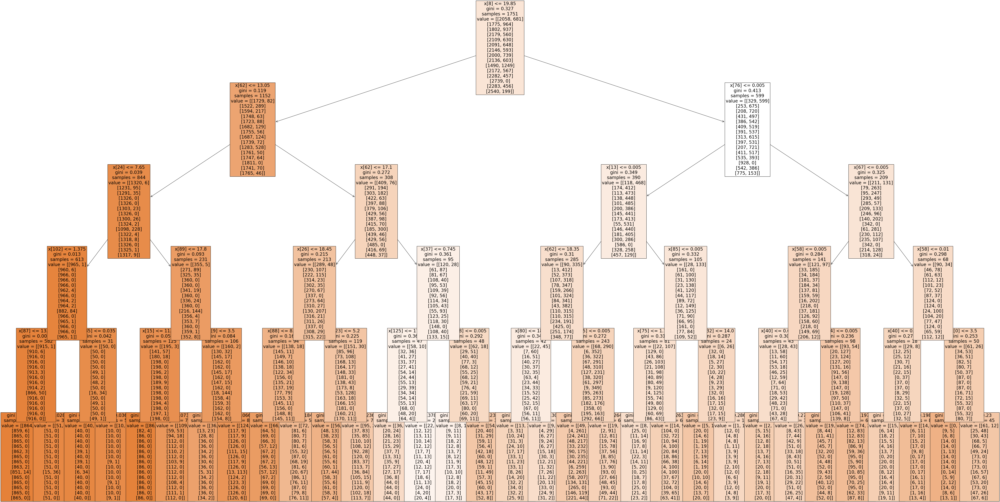

In [32]:
fig = plt.figure(figsize=(80, 40))
plot_tree(clf.estimators_[15], fontsize=20, class_names=pleasant, filled=True)

plt.savefig('decision_tree_plot_e15.png')

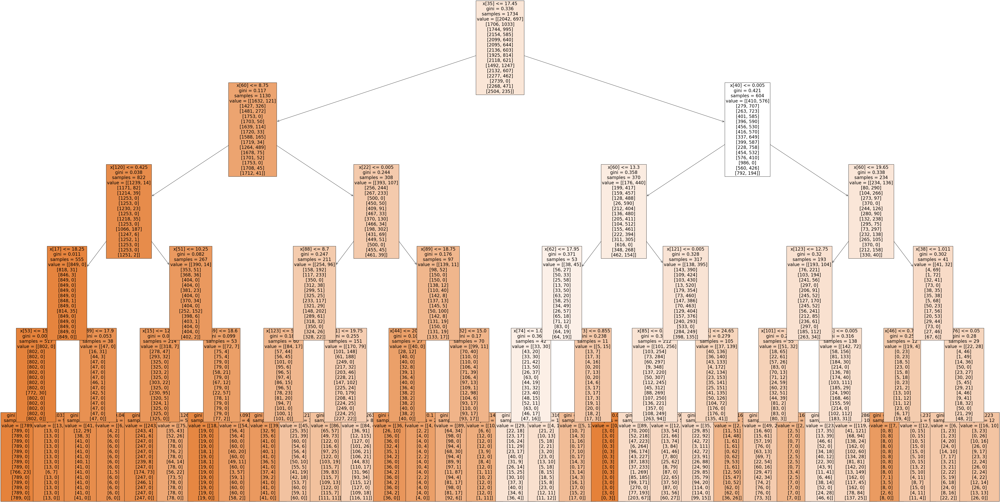

In [34]:
fig = plt.figure(figsize=(80, 40))
plot_tree(clf.estimators_[50], fontsize=20, class_names=pleasant, filled=True)

plt.savefig('decision_tree_plot_e50.png')

### ------

### 4. Check the Importance by city and by observation type

In [36]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
newarray

array([5.92524770e-04, 7.61318053e-04, 5.32151576e-04, 1.13826206e-03,
       1.62104725e-02, 1.96739369e-03, 4.82674933e-02, 6.19577151e-04,
       3.96932078e-02, 1.09228962e-03, 3.33098473e-04, 4.96299157e-04,
       1.37507528e-03, 9.15404735e-03, 1.57217908e-03, 2.63427270e-03,
       8.59069284e-03, 6.47019771e-03, 6.58790859e-04, 2.91068640e-04,
       5.03238215e-04, 1.70343280e-03, 1.05676943e-02, 1.83548810e-03,
       1.36273706e-02, 6.22802247e-03, 2.95191122e-02, 2.34585514e-03,
       1.02915118e-03, 2.96444754e-03, 2.03449992e-03, 1.37553019e-02,
       2.18942229e-03, 3.29618486e-02, 6.60578750e-05, 5.52046590e-02,
       3.85040307e-03, 1.00440615e-03, 1.24756997e-03, 6.57760665e-03,
       1.73654066e-02, 1.18925613e-02, 3.45494898e-02, 4.46414643e-03,
       2.75227443e-02, 0.00000000e+00, 2.71091350e-04, 1.77880170e-03,
       7.58231259e-04, 6.33851025e-03, 1.85758625e-03, 1.23376669e-02,
       5.11099794e-04, 1.68187620e-02, 8.69652461e-04, 1.25517044e-03,
      

In [66]:
newarray = newarray.reshape(-1,9,15)

In [67]:
sumarray = np.sum(newarray[0], axis=0)
sumarray

array([0.07544458, 0.05792593, 0.06857234, 0.11497535, 0.0437379 ,
       0.14136441, 0.10010844, 0.0278903 , 0.07881954, 0.03371736,
       0.03274054, 0.05993913, 0.06262389, 0.04143118, 0.06070912])

In [68]:
city = [
 'BASEL',
 'BELGRADE',
 'BUDAPEST',
 'DEBILT',
 'DUSSELDORF',
 'HEATHROW',
 'KASSEL',
 'LJUBLJANA',
 'MAASTRICHT',
 'MADRID',
 'MUNCHENB',
 'OSLO',
 'SONNBLICK',
 'STOCKHOLM',
 'VALENTIA'
]

In [69]:
important = pd.Series(sumarray, index = city) #.sort_values(ascending = False)
important

BASEL         0.075445
BELGRADE      0.057926
BUDAPEST      0.068572
DEBILT        0.114975
DUSSELDORF    0.043738
HEATHROW      0.141364
KASSEL        0.100108
LJUBLJANA     0.027890
MAASTRICHT    0.078820
MADRID        0.033717
MUNCHENB      0.032741
OSLO          0.059939
SONNBLICK     0.062624
STOCKHOLM     0.041431
VALENTIA      0.060709
dtype: float64

['BASEL', 'BELGRADE', 'BUDAPEST', 'DEBILT', 'DUSSELDORF', 'HEATHROW', 'KASSEL', 'LJUBLJANA', 'MAASTRICHT', 'MADRID', 'MUNCHENB', 'OSLO', 'SONNBLICK', 'STOCKHOLM', 'VALENTIA']


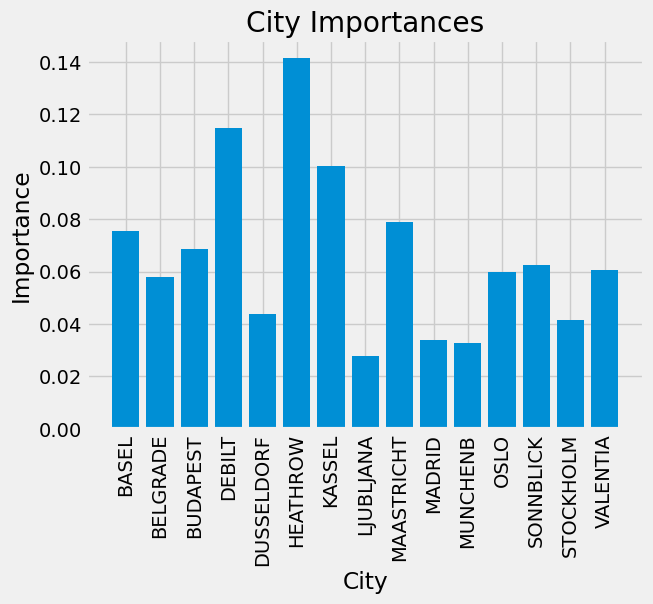

In [76]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(city)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, city, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('City'); plt.title('City Importances');
plt.savefig('City Importances_1.png', bbox_inches='tight')

## Variable importances by observation type

In [72]:
newarray_ob = newarray.reshape(-1,15,9)

In [73]:
sumarray_ob = np.sum(newarray_ob[0], axis=0)
sumarray_ob

array([0.01878187, 0.01041103, 0.01400755, 0.03791059, 0.15177075,
       0.0385688 , 0.33017715, 0.04154407, 0.35682818])

In [74]:
important_ob = pd.Series(sumarray_ob, index = obtype) #.sort_values(ascending = False)
important_ob

cloud_cover         0.018782
humidity            0.010411
pressure            0.014008
global_radiation    0.037911
precipitation       0.151771
sunshine            0.038569
temp_mean           0.330177
temp_min            0.041544
temp_max            0.356828
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


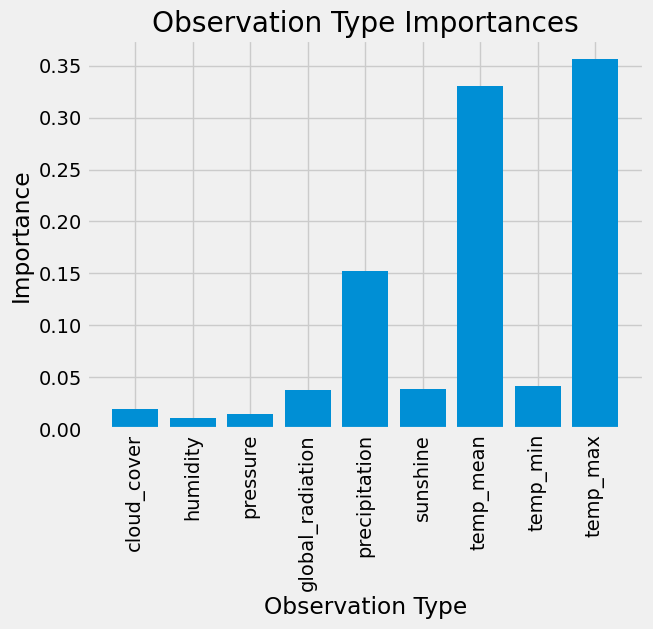

In [75]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important_ob)))
print(obtype)

plt.bar(x_values, important_ob, orientation = 'vertical')
plt.xticks(x_values, obtype, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Observation Type'); plt.title('Observation Type Importances')
plt.savefig('Observation Type Importances_1.png', bbox_inches='tight')

### ----------

### 5. Top3 Stations RT

#### 5.1. creating sub dataset with top3 city 

In [84]:
# create top3 city list 
top3_city = important.nlargest(3)
top3_city = top3_city.sort_index().index.tolist()
print(top3_city)

['DEBILT', 'HEATHROW', 'KASSEL']


In [86]:
# check the each index of cities
for city in top3_city:
    index_in_important = important.index.get_loc(city) 
    print(f"{city}: {index_in_important}")

DEBILT: 3
HEATHROW: 5
KASSEL: 6


In [88]:
df_top3_city = pd.DataFrame() 

for city in top3_city:  
    for column in df.columns:  
        if city in column:  
            df_top3_city[column] = df[column]  

print(df_top3_city)

       DEBILT_cloud_cover  DEBILT_humidity  DEBILT_pressure  \
0                       7             0.85           1.0032   
1                       8             0.90           1.0056   
2                       6             0.92           1.0165   
3                       8             0.95           1.0265   
4                       6             0.90           1.0243   
...                   ...              ...              ...   
22945                   8             0.84           1.0190   
22946                   8             0.84           1.0177   
22947                   8             0.86           1.0174   
22948                   8             0.87           1.0174   
22949                   8             0.89           1.0156   

       DEBILT_global_radiation  DEBILT_precipitation  DEBILT_sunshine  \
0                         0.07                  0.25              0.0   
1                         0.14                  0.06              0.1   
2                       

In [89]:
y_top3_city = pd.DataFrame() 

for city in top3_city:  
    for column in dfy.columns:  
        if city in column:  
            y_top3_city[column] = dfy[column]  

print(y_top3_city)

       DEBILT_pleasant_weather  HEATHROW_pleasant_weather  \
0                            0                          0   
1                            0                          0   
2                            0                          0   
3                            0                          0   
4                            0                          0   
...                        ...                        ...   
22945                        0                          0   
22946                        0                          0   
22947                        0                          0   
22948                        0                          0   
22949                        0                          0   

       KASSEL_pleasant_weather  
0                            0  
1                            0  
2                            0  
3                            0  
4                            0  
...                        ...  
22945                        0  
229

#### 5.2. preparing train/test set

In [90]:
X_top3=df_top3_city.to_numpy()
y_top3=y_top3_city.to_numpy()

In [92]:
X_train_top3,X_test_top3, y_train_top3, y_test_top3 = train_test_split(X_top3, y_top3, random_state=23)

#### 5.3. Tranin/Test a RF model

In [98]:
# applying the same RF model clf
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf_top3=clf.fit(X_train_top3, y_train_top3)

#### Accuracy

In [99]:
# performing predictions on the test dataset
y_pred_top3 = clf_top3.predict(X_test_top3)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test_top3, y_pred_top3))

Model Accuracy:  0.9161728825374695


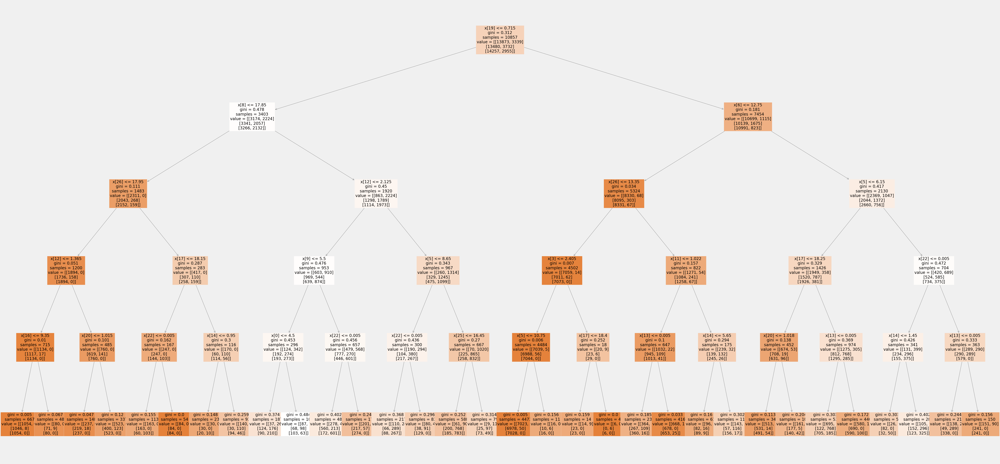

In [100]:
fig = plt.figure(figsize=(80, 40))
plot_tree(clf_top3.estimators_[15], fontsize=20, class_names=pleasant, filled=True)

plt.savefig('decision_tree_plot_top3_e15.png')

#### 5.4. Check the Importance by city and by observation type

##### BY CITY

In [101]:
np.set_printoptions(threshold=np.inf)
newarray_top3 = clf_top3.feature_importances_
newarray_top3

array([2.19358244e-02, 2.78173827e-03, 1.10672689e-02, 4.07292414e-02,
       1.17125111e-01, 1.76196516e-02, 4.48557819e-02, 3.90066806e-03,
       1.43444105e-01, 3.24774413e-03, 1.18301202e-02, 6.51429729e-03,
       3.10977693e-02, 9.04750377e-02, 1.51606111e-02, 5.44392017e-02,
       1.72083767e-02, 1.19991234e-01, 8.01496184e-05, 3.39617049e-03,
       3.87843888e-03, 2.57528869e-02, 6.58505605e-02, 1.18065029e-02,
       4.78079066e-02, 1.10503461e-02, 7.69532549e-02])

In [102]:
newarray_top3 = newarray_top3.reshape(-1,9,3)

In [103]:
sumarray_top3 = np.sum(newarray_top3[0], axis=0)
sumarray_top3

array([0.26994651, 0.32361813, 0.40643536])

In [104]:
top3_city

['DEBILT', 'HEATHROW', 'KASSEL']

In [105]:
important_top3 = pd.Series(sumarray_top3, index = top3_city) #.sort_values(ascending = False)
important_top3

DEBILT      0.269947
HEATHROW    0.323618
KASSEL      0.406435
dtype: float64

['DEBILT', 'HEATHROW', 'KASSEL']


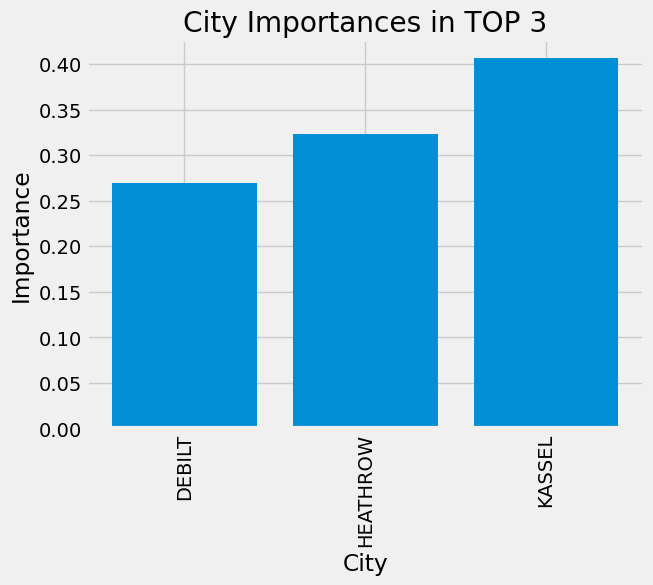

In [106]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important_top3)))
print(top3_city)

plt.bar(x_values, important_top3, orientation = 'vertical')
plt.xticks(x_values, top3_city, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('City'); plt.title('City Importances in TOP 3');
plt.savefig('top3 City Importances_1.png', bbox_inches='tight')

##### by observation type

In [107]:
newarray_top3_ob = newarray_top3.reshape(-1,3,9)

In [108]:
sumarray_top3_ob = np.sum(newarray_top3_ob[0], axis=0)
sumarray_top3_ob

array([0.02526372, 0.01800803, 0.02146001, 0.0975799 , 0.27345071,
       0.04458677, 0.14710289, 0.03215939, 0.34038859])

In [109]:
important_top3_ob = pd.Series(sumarray_top3_ob, index = obtype) #.sort_values(ascending = False)
important_top3_ob

cloud_cover         0.025264
humidity            0.018008
pressure            0.021460
global_radiation    0.097580
precipitation       0.273451
sunshine            0.044587
temp_mean           0.147103
temp_min            0.032159
temp_max            0.340389
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


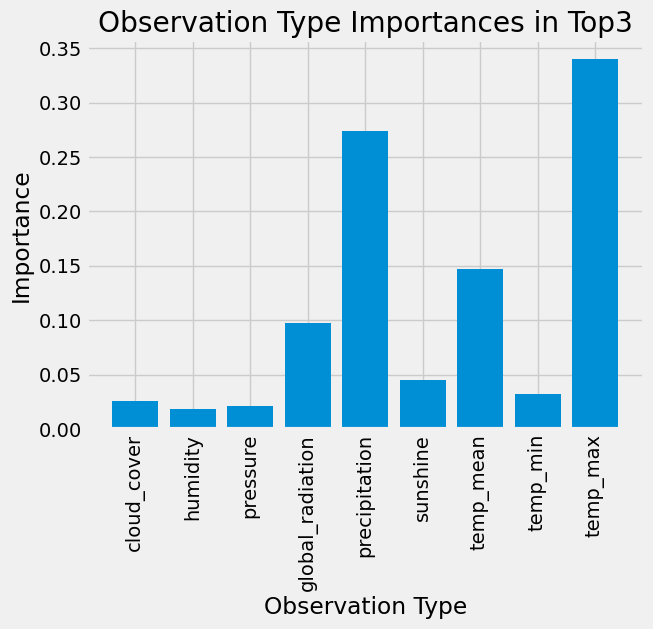

In [110]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important_top3_ob)))
print(obtype)

plt.bar(x_values, important_top3_ob, orientation = 'vertical')
plt.xticks(x_values, obtype, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Observation Type'); plt.title('Observation Type Importances in Top3')
plt.savefig('Observation Type Importances_top3_1.png', bbox_inches='tight')

### 6. Top 3 - DEBILT

#### 6.1. creating DEBLLIN dataset

In [122]:
df_DEBILT = pd.DataFrame() 

for column in df.columns:  
    if 'DEBILT' in column:  
        df_DEBILT[column] = df[column]  

print(df_DEBILT)

       DEBILT_cloud_cover  DEBILT_humidity  DEBILT_pressure  \
0                       7             0.85           1.0032   
1                       8             0.90           1.0056   
2                       6             0.92           1.0165   
3                       8             0.95           1.0265   
4                       6             0.90           1.0243   
...                   ...              ...              ...   
22945                   8             0.84           1.0190   
22946                   8             0.84           1.0177   
22947                   8             0.86           1.0174   
22948                   8             0.87           1.0174   
22949                   8             0.89           1.0156   

       DEBILT_global_radiation  DEBILT_precipitation  DEBILT_sunshine  \
0                         0.07                  0.25              0.0   
1                         0.14                  0.06              0.1   
2                       

In [123]:
y_DEBILT = pd.DataFrame() 

for column in dfy.columns:  
    if 'DEBILT' in column:  
        y_DEBILT[column] = dfy[column]  

print(y_DEBILT)

       DEBILT_pleasant_weather
0                            0
1                            0
2                            0
3                            0
4                            0
...                        ...
22945                        0
22946                        0
22947                        0
22948                        0
22949                        0

[22950 rows x 1 columns]


#### 6.2. preparing train/test set

In [124]:
X_DEBILT=df_DEBILT.to_numpy()
y_DEBILT=y_DEBILT.to_numpy()

In [125]:
X_train_DEBILT,X_test_DEBILT, y_train_DEBILT, y_test_DEBILT = train_test_split(X_DEBILT, y_DEBILT, random_state=23)

In [126]:
print(X_train_DEBILT.shape, X_test_DEBILT.shape)
print(y_train_DEBILT.shape, y_test_DEBILT.shape)

(17212, 9) (5738, 9)
(17212, 1) (5738, 1)


#### 6.3. Tranin/Test a RF model

In [127]:
# Creating a new RF model 
clf_DE = RandomForestClassifier(n_estimators = 81, max_depth=9)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf_DE.fit(X_train_DEBILT, y_train_DEBILT)

# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf_DEBILT=clf_DE.fit(X_train_DEBILT, y_train_DEBILT)

C:\Users\jinu5\anaconda3\Lib\site-packages\sklearn\base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)
C:\Users\jinu5\anaconda3\Lib\site-packages\sklearn\base.py:1151: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


In [128]:
y_train_DEBILT = np.ravel(y_train_DEBILT)

In [129]:
# Creating a new RF model 
clf_DE = RandomForestClassifier(n_estimators = 81, max_depth=9)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf_DE.fit(X_train_DEBILT, y_train_DEBILT)

# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf_DEBILT=clf_DE.fit(X_train_DEBILT, y_train_DEBILT)

#### Accuracy

In [130]:
# performing predictions on the test dataset
y_pred_DEBILT = clf_DEBILT.predict(X_test_DEBILT)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test_DEBILT, y_pred_DEBILT))

Model Accuracy:  1.0


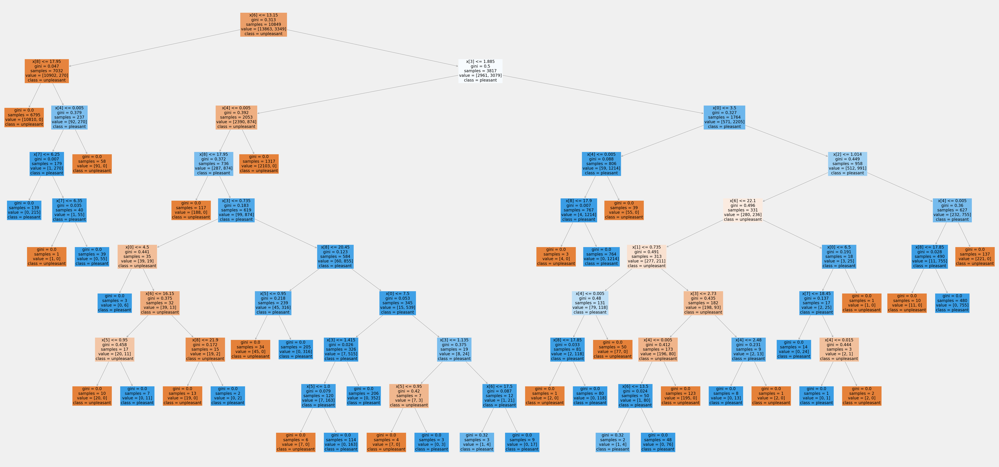

In [134]:
fig = plt.figure(figsize=(80, 40))
plot_tree(clf_DEBILT.estimators_[80], fontsize=20, class_names=pleasant, filled=True)

plt.savefig('decision_tree_plot_DEBILT_e81.png')

#### 6.4. Check the Importance by observation type

In [158]:
np.set_printoptions(threshold=np.inf)
newarray_DEBILT = clf_DEBILT.feature_importances_
newarray_DEBILT

array([0.0095241 , 0.0534818 , 0.01665117, 0.10111093, 0.29384937,
       0.07487599, 0.10463978, 0.01984971, 0.32601715])

In [159]:
newarray_DEBILT = newarray_DEBILT.reshape(-1,1,9)

In [160]:
sumarray_DEBILT = np.sum(newarray_DEBILT[0], axis=0)
sumarray_DEBILT

array([0.0095241 , 0.0534818 , 0.01665117, 0.10111093, 0.29384937,
       0.07487599, 0.10463978, 0.01984971, 0.32601715])

In [161]:
important_DEBILT = pd.Series(sumarray_DEBILT, index = obtype) #.sort_values(ascending = False)
important_DEBILT

cloud_cover         0.009524
humidity            0.053482
pressure            0.016651
global_radiation    0.101111
precipitation       0.293849
sunshine            0.074876
temp_mean           0.104640
temp_min            0.019850
temp_max            0.326017
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


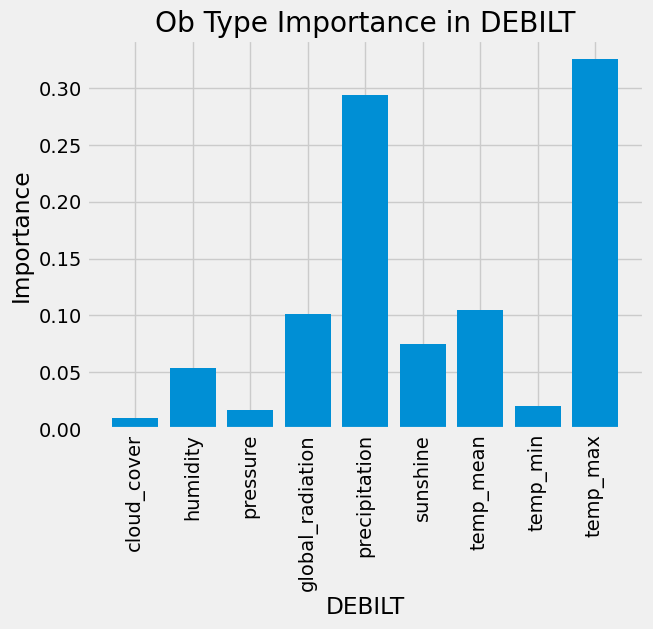

In [186]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important_DEBILT)))
print(obtype)

plt.bar(x_values, important_DEBILT, orientation = 'vertical')
plt.xticks(x_values, obtype, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('DEBILT'); plt.title('Ob Type Importance in DEBILT');
plt.savefig('DEBILT Importances_1.png', bbox_inches='tight')

### -----------------


### 7. Top 3 - HEATHROW

#### 7.1. creating HEATHROW dataset

In [143]:
df_HEATHROW = pd.DataFrame() 
#HEATHROW', 'KASSEL'
for column in df.columns:  
    if 'HEATHROW' in column:  
        df_HEATHROW[column] = df[column]  

print(df_HEATHROW)

       HEATHROW_cloud_cover  HEATHROW_humidity  HEATHROW_pressure  \
0                         7               0.91             1.0010   
1                         7               0.98             1.0051   
2                         8               0.96             1.0166   
3                         8               0.98             1.0230   
4                         5               0.84             1.0275   
...                     ...                ...                ...   
22945                     5               0.87             1.0140   
22946                     4               0.82             1.0152   
22947                     7               0.85             1.0138   
22948                     5               0.86             1.0147   
22949                     5               0.89             1.0107   

       HEATHROW_global_radiation  HEATHROW_precipitation  HEATHROW_sunshine  \
0                           0.13                    0.22                0.0   
1            

In [145]:
y_HEATHROW = pd.DataFrame() 

for column in dfy.columns:  
    if 'HEATHROW' in column:  
        y_HEATHROW[column] = dfy[column]  

print(y_HEATHROW)

       HEATHROW_pleasant_weather
0                              0
1                              0
2                              0
3                              0
4                              0
...                          ...
22945                          0
22946                          0
22947                          0
22948                          0
22949                          0

[22950 rows x 1 columns]


#### 7.2. preparing train/test set

In [146]:
X_HEATHROW=df_HEATHROW.to_numpy()
y_HEATHROW=y_HEATHROW.to_numpy()

In [147]:
X_train_HEATHROW,X_test_HEATHROW, y_train_HEATHROW, y_test_HEATHROW = train_test_split(X_HEATHROW, y_HEATHROW, random_state=23)

In [148]:
print(X_train_HEATHROW.shape, X_test_HEATHROW.shape)
print(y_train_HEATHROW.shape, y_test_HEATHROW.shape)

(17212, 9) (5738, 9)
(17212, 1) (5738, 1)


#### 7.3. Tranin/Test a RF model

In [149]:
y_train_HEATHROW = np.ravel(y_train_HEATHROW)

In [187]:
# Creating a new RF model 
clf_HE = RandomForestClassifier(n_estimators = 81, max_depth=9)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf_HE.fit(X_train_HEATHROW, y_train_HEATHROW)

# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf_HEATHROW=clf_HE.fit(X_train_HEATHROW, y_train_HEATHROW)

#### Accuracy

In [188]:
# performing predictions on the test dataset
y_pred_HEATHROW = clf_HEATHROW.predict(X_test_HEATHROW)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test_HEATHROW, y_pred_HEATHROW))

Model Accuracy:  1.0


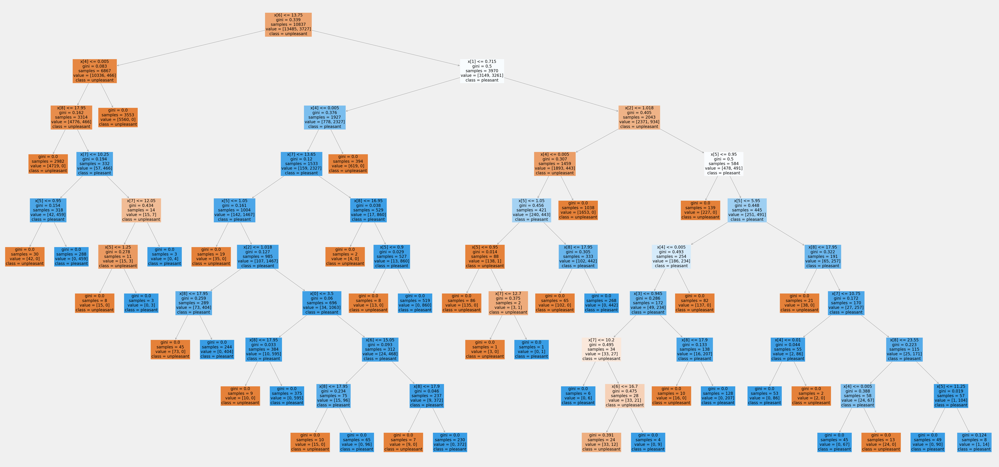

In [189]:
fig = plt.figure(figsize=(80, 40))
plot_tree(clf_HEATHROW.estimators_[10], fontsize=20, class_names=pleasant, filled=True)

plt.savefig('decision_tree_plot_HEATHROW_e81.png')

#### 7.4. Check the Importance by observation type

In [190]:
np.set_printoptions(threshold=np.inf)
newarray_HEATHROW = clf_HEATHROW.feature_importances_
newarray_HEATHROW

array([0.01515934, 0.04079621, 0.01603935, 0.0565184 , 0.30111401,
       0.07590496, 0.14675628, 0.01116769, 0.33654375])

In [191]:
newarray_HEATHROW = newarray_HEATHROW.reshape(-1,1,9)

In [192]:
sumarray_HEATHROW = np.sum(newarray_HEATHROW[0], axis=0)
sumarray_HEATHROW

array([0.01515934, 0.04079621, 0.01603935, 0.0565184 , 0.30111401,
       0.07590496, 0.14675628, 0.01116769, 0.33654375])

In [193]:
important_HEATHROW = pd.Series(sumarray_HEATHROW, index = obtype) #.sort_values(ascending = False)
important_HEATHROW

cloud_cover         0.015159
humidity            0.040796
pressure            0.016039
global_radiation    0.056518
precipitation       0.301114
sunshine            0.075905
temp_mean           0.146756
temp_min            0.011168
temp_max            0.336544
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


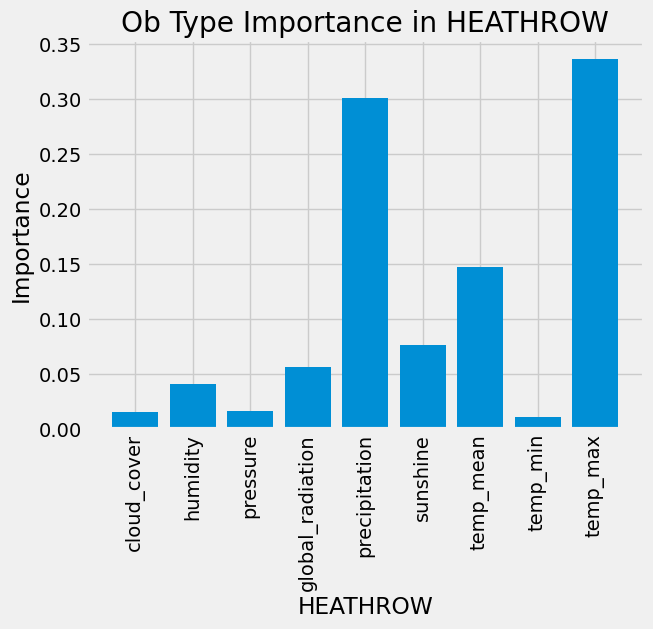

In [194]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important_HEATHROW)))
print(obtype)

plt.bar(x_values, important_HEATHROW, orientation = 'vertical')
plt.xticks(x_values, obtype, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('HEATHROW'); plt.title('Ob Type Importance in HEATHROW');
plt.savefig('HEATHROW Importances_1.png', bbox_inches='tight')

### -----------------


### 8. Top 3 - KASSEL

#### 8.1. creating HEATHROW dataset

In [168]:
df_KASSEL = pd.DataFrame() 
#HEATHROW', 'KASSEL'
for column in df.columns:  
    if 'KASSEL' in column:  
        df_KASSEL[column] = df[column]  

print(df_KASSEL)

       KASSEL_cloud_cover  KASSEL_humidity  KASSEL_pressure  \
0                       8             0.82           1.0094   
1                       6             0.86           1.0086   
2                       8             0.91           1.0129   
3                       6             0.87           1.0290   
4                       7             0.86           1.0262   
...                   ...              ...              ...   
22945                   4             0.82           1.0291   
22946                   3             0.81           1.0270   
22947                   3             0.77           1.0238   
22948                   3             0.77           1.0114   
22949                   3             0.77           1.0161   

       KASSEL_global_radiation  KASSEL_precipitation  KASSEL_sunshine  \
0                         0.28                  0.48              1.6   
1                         0.12                  0.27              0.0   
2                       

In [172]:
y_KASSEL = pd.DataFrame() 

for column in dfy.columns:  
    if 'KASSEL' in column:  
        y_KASSEL[column] = dfy[column]  

print(y_KASSEL)

       KASSEL_pleasant_weather
0                            0
1                            0
2                            0
3                            0
4                            0
...                        ...
22945                        0
22946                        0
22947                        0
22948                        0
22949                        0

[22950 rows x 1 columns]


#### 8.2. preparing train/test set

In [173]:
X_KASSEL=df_KASSEL.to_numpy()
y_KASSEL=y_KASSEL.to_numpy()

In [174]:
X_train_KASSEL,X_test_KASSEL, y_train_KASSEL, y_test_KASSEL = train_test_split(X_KASSEL, y_KASSEL, random_state=23)

In [175]:
print(X_train_KASSEL.shape, X_test_KASSEL.shape)
print(y_train_KASSEL.shape, y_test_KASSEL.shape)

(17212, 9) (5738, 9)
(17212, 1) (5738, 1)


#### 8.3. Tranin/Test a RF model

In [176]:
y_train_KASSEL = np.ravel(y_train_KASSEL)

#### For DEBLINT and HEATHROW, there seems to be an overfitting, with 100% accuracy, so we want to tune the model for KASSSEL. 

In [177]:
# Creating a new RF model 
clf_K = RandomForestClassifier(n_estimators = 50, max_depth=7)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf_K.fit(X_train_KASSEL, y_train_KASSEL)
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf_K.fit(X_train_KASSEL, y_train_KASSEL)

# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf_KASSEL=clf_K.fit(X_train_KASSEL, y_train_KASSEL)

#### Accuracy

In [178]:
# performing predictions on the test dataset
y_pred_KASSEL = clf_KASSEL.predict(X_test_KASSEL)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test_KASSEL, y_pred_KASSEL))

Model Accuracy:  0.962879051934472


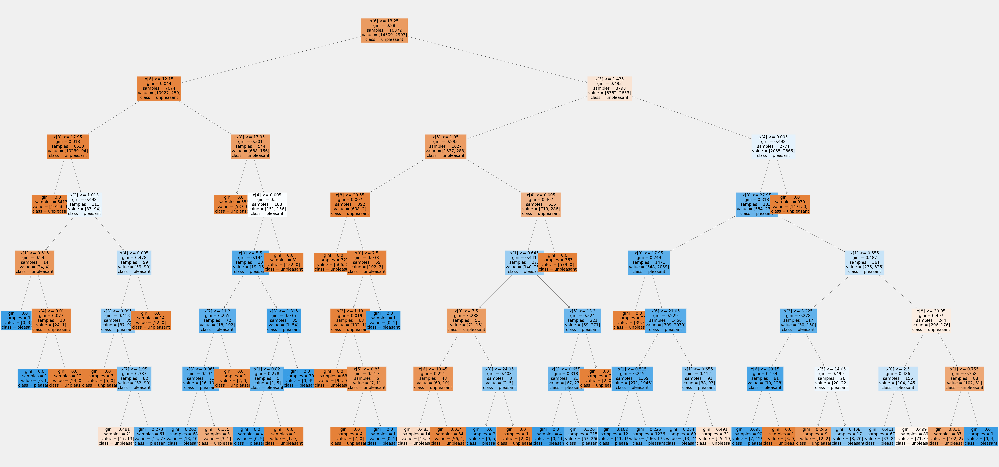

In [179]:
fig = plt.figure(figsize=(80, 40))
plot_tree(clf_KASSEL.estimators_[23], fontsize=20, class_names=pleasant, filled=True)

plt.savefig('decision_tree_plot_KASSEL_e23.png')

#### 8.4. Check the Importance by observation type

In [180]:
np.set_printoptions(threshold=np.inf)
newarray_KASSEL = clf_KASSEL.feature_importances_
newarray_KASSEL

array([0.00204688, 0.03950446, 0.02264022, 0.12068423, 0.30743889,
       0.06133734, 0.119706  , 0.03603933, 0.29060265])

In [181]:
newarray_KASSEL = newarray_KASSEL.reshape(-1,1,9)

In [182]:
sumarray_KASSEL = np.sum(newarray_KASSEL[0], axis=0)
sumarray_KASSEL

array([0.00204688, 0.03950446, 0.02264022, 0.12068423, 0.30743889,
       0.06133734, 0.119706  , 0.03603933, 0.29060265])

In [183]:
important_KASSEL = pd.Series(sumarray_KASSEL, index = obtype) #.sort_values(ascending = False)
important_KASSEL

cloud_cover         0.002047
humidity            0.039504
pressure            0.022640
global_radiation    0.120684
precipitation       0.307439
sunshine            0.061337
temp_mean           0.119706
temp_min            0.036039
temp_max            0.290603
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


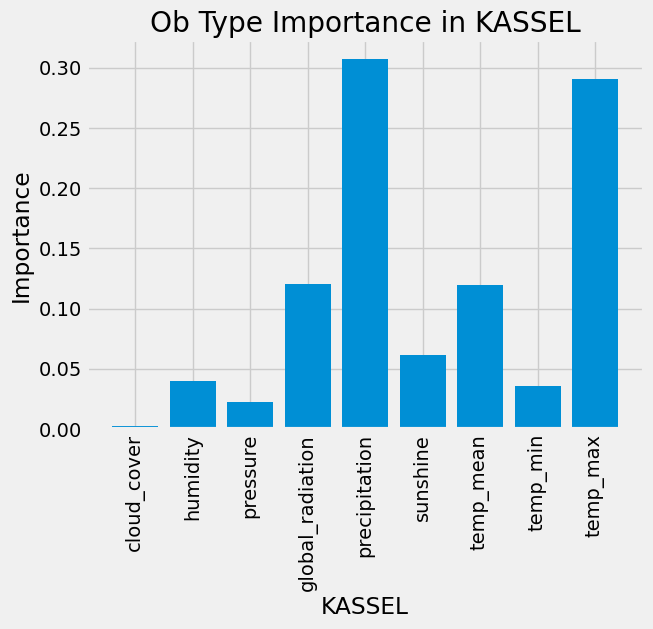

In [184]:
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important_KASSEL)))
print(obtype)

plt.bar(x_values, important_KASSEL, orientation = 'vertical')
plt.xticks(x_values, obtype, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('KASSEL'); plt.title('Ob Type Importance in KASSEL');
plt.savefig('KASSEL Importances_1.png', bbox_inches='tight')

### -----------

### 9. Insights

#### 
What we found with the random forest model is that average temperature, maximum temperature, and precipitation are the most important factors in determining a pleasant day.   
cloud_cover 0.018782  
humidity 0.010411  
pressure 0.014008  
global_radiation 0.037911  
precipitation 0.151771  
sunshine 0.038569  
temp_mean 0.330177  
temp_min 0.041544  
temp_max 0.356828  
  
There was also variation in the importance of each station, which would need to be confirmed with other models, but HEATHROW was more than 5 times more important than LJUBLJANA.   
  
BASEL 0.075445  
belgrade 0.057926  
budapest 0.068572  
DEBILT 0.114975  
dusseldorf 0.043738  
heatrow 0.141364  
KASSEL 0.100108  
ljubljana 0.027890  
maastricht 0.078820  
MADRID 0.033717  
munchenb 0.032741  
OSLO 0.059939  
sornblick 0.062624  
stockholm 0.041431  
VALENTIA 0.060709  
  
The stations also differed slightly in the important climate factors. In Kassel, precipitation was found to be more important than elsewhere. 
However, since most European weather is not very hot, the importance of minimum temperatures seems to have been underestimated. More data from a wider range of locations would improve the accuracy of the model's predictions. 